# Plant Disease Classification Using Transfer Learning Methods

In [ ]:
Code by - Nikhil Awachat
Student ID - x21100446
Superviosr - Dr. Christian Horn

# Importing Libraries

In [1]:
# Importing all the required libraries
import numpy as np
import pandas as pd
import glob
import shutil
import matplotlib.pyplot as plt
import os
import cv2
from sklearn import preprocessing
import random
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.decomposition import PCA
from tensorflow.keras.models import Sequential, Model 
from tensorflow.keras.layers import Dropout, Add, Dense, Flatten, Conv2D, MaxPool2D
from tensorflow.python.util import deprecation
deprecation._PRINT_DEPRECATION_WARNINGS = True
from keras.initializers import glorot_uniform
from keras import initializers, layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import CategoricalCrossentropy
from sklearn.metrics import confusion_matrix
from keras.layers import Conv2D, MaxPooling2D
import tensorflow
import keras
from tqdm.notebook import tqdm
import time,random
import cv2
from skimage import io,color,exposure,transform
from sklearn.model_selection import train_test_split
from sklearn import metrics
import tensorflow as tf
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, AveragePooling2D, Flatten, GlobalAveragePooling2D, Dense, Dropout
from keras.layers.merge import concatenate

In [7]:
#Seting souce path for the code
source_path=r"C:/Users/Nik/Desktop/Plant Disease/Data/Train/Train/"
balanced_dataset_folder=r'balanced_dataset'

# Data Pre-processing

In [8]:
#Data balancing using augmented images
c=0
List = os.listdir(source_path)
print(List)
for x in List:
    folder= balanced_dataset_folder+r'/'+x+r'/'
    if os.path.exists(folder):
        pass
    else:
        os.makedirs(folder)
    path=os.path.join(source_path,x)
    images_folder = os.listdir(path)
    for images in images_folder:
        image_path = path + '/' + images
        if x == 'healthy_wheat':
            image1 = cv2.imread(image_path)
            cv2.imwrite(folder+x+str(c)+r'_.png',image1)
            c+=1
            if c>=17:
                image2 = cv2.flip(image1,1)
                cv2.imwrite(folder+x+str(c)+r'_.png',image2)
                c+=1
                
                image3 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
                cv2.imwrite(folder+x+str(c)+r'_.png',image3)
                c+=1
        else:
            image = cv2.imread(image_path)
            cv2.imwrite(folder+x+str(c)+r'_.png',image)
            c+=1
print('Count of total images in balanced dataset is: {}'.format(c))

['healthy_wheat', 'leaf_rust', 'stem_rust']
Count of total images in balanced dataset is: 1128


In [9]:
#Creating two folders for train and test
categories=['healthy_wheat', 'leaf_rust', 'stem_rust']
try:
    for category in categories:
        path = os.path.join("./train", category)
        os.makedirs(path)
        path = os.path.join("./test", category)
        os.makedirs(path)   
    print("Folders created")
except:
    print("Folders already created")

Folders created


In [10]:
#Spliting data in 75/25 ratio in train test
source_path=r"C:/Users/Nik/Desktop/Plant Disease/balanced_dataset/"
def generateData(lst,fnm):
    for i in range(len(lst)):
        if i<=len(lst)*0.75:
            destination="./train/"+fnm
            folder=fnm+"/"
        else: 
            destination="./test/"+fnm
            folder=fnm+"/"
        shutil.copy(os.path.join(source_path,folder,lst[i]), destination)

In [11]:
healthy_wheat = os.listdir("./balanced_dataset/healthy_wheat")
leaf_rust = os.listdir("./balanced_dataset/leaf_rust")
stem_rust = os.listdir("./balanced_dataset/stem_rust")

In [12]:
try:
    generateData(healthy_wheat,"healthy_wheat")
    generateData(leaf_rust,"leaf_rust")
    generateData(stem_rust,"stem_rust")
    print("Images set in training and testing folders")
except:
    print("Images already set in training and testing folders")

Images set in training and testing folders


In [13]:
healthy_wheat_images = glob.glob("./train/healthy_wheat/*")
leaf_rust_images = glob.glob("./train/leaf_rust/*")
stem_rust_images = glob.glob("./train/stem_rust/*")

# Data Augmentation

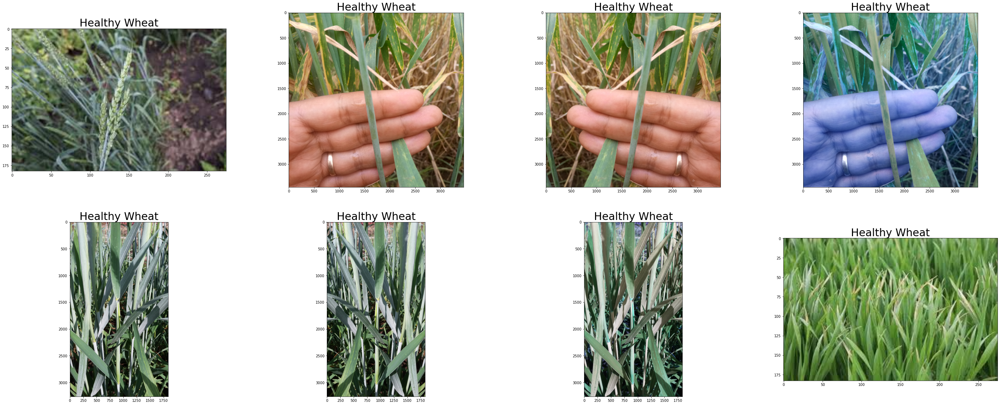

In [16]:
#Augmenting images to RGB
count = 1
f = plt.figure(figsize=(50,20))
for file in healthy_wheat_images[:8]:
    img = cv2.imread(file)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    ax = f.add_subplot(2, 4,count)
    ax = plt.imshow(img)
    ax = plt.title('Healthy Wheat',fontsize= 30)
    count = count + 1
plt.show()

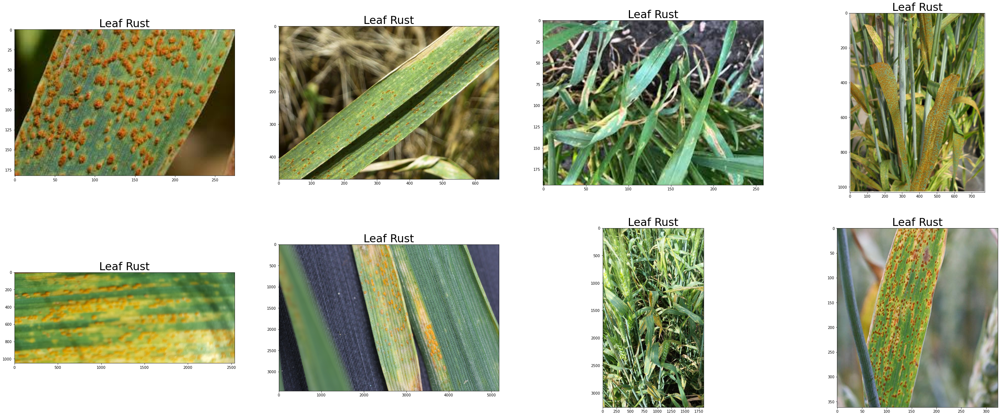

In [17]:
#Augmenting images to RGB
count = 1
f = plt.figure(figsize=(50,20))
for file in leaf_rust_images[:8]:
    img = cv2.imread(file)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    ax = f.add_subplot(2, 4,count)
    ax = plt.imshow(img)
    ax = plt.title('Leaf Rust',fontsize= 30)
    count = count + 1
plt.show()

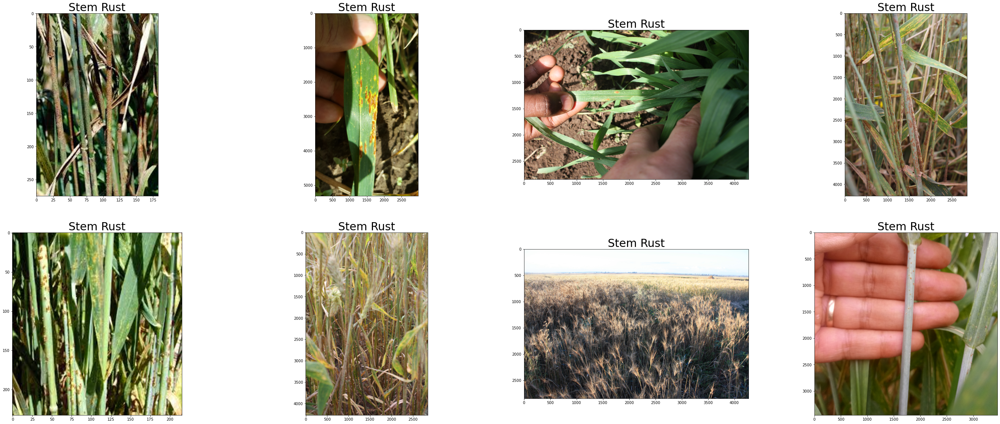

In [18]:
#Augmenting images to RGB
count = 1
f = plt.figure(figsize=(50,20))
for file in stem_rust_images[:8]:
    img = cv2.imread(file)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    ax = f.add_subplot(2, 4,count)
    ax = plt.imshow(img)
    ax = plt.title('Stem Rust',fontsize= 30)
    count = count + 1
plt.show()

## Finding Contour

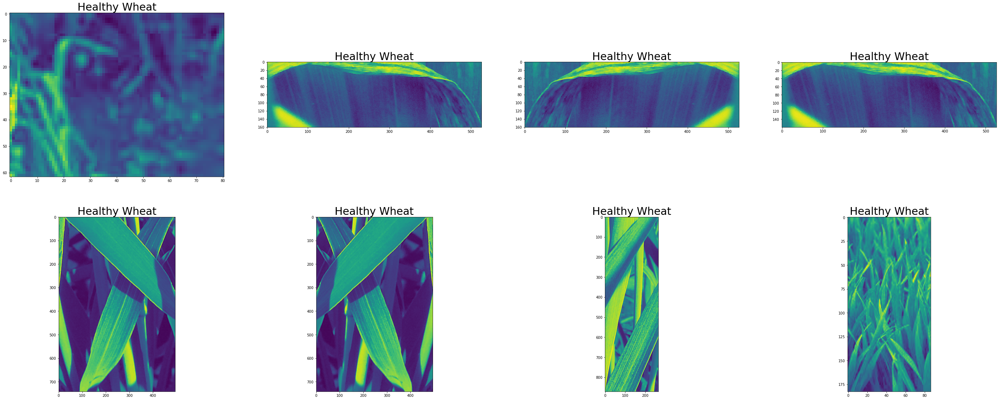

In [19]:
#Augmenting images to RGB to Gray and finging contour
count = 1
f = plt.figure(figsize=(50,20))
for file in healthy_wheat_images[:8]:
    img = cv2.imread(file)
    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    adapimg = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV,11,3)
    cnts = cv2.findContours(adapimg, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    cnts = sorted(cnts, key=cv2.contourArea, reverse=True)
    for c in cnts:
        x,y,w,h = cv2.boundingRect(c)
        img_ROI = img[y:y+h, x:x+w]
        break
    ax = f.add_subplot(2, 4,count)
    ax = plt.imshow(img_ROI)
    ax = plt.title('Healthy Wheat',fontsize= 30)
    count = count + 1
plt.show()

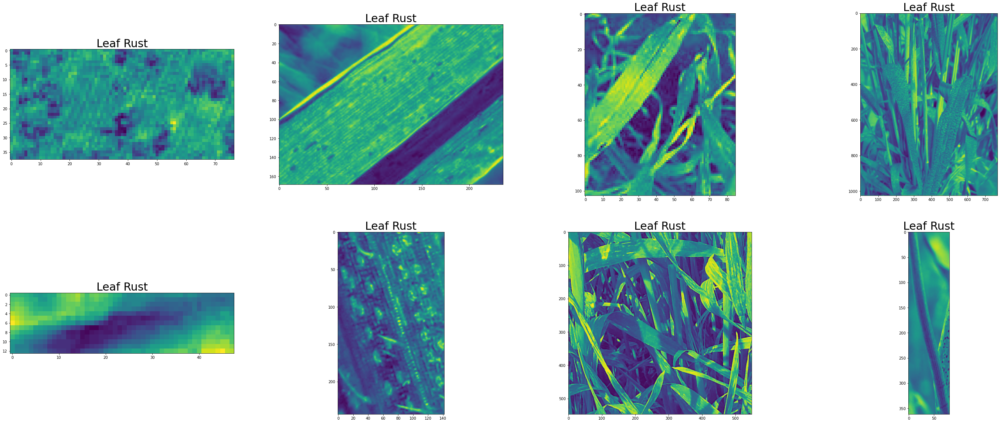

In [20]:
#Augmenting images to RGB to Gray and finging contour
count = 1
f = plt.figure(figsize=(50,20))
for file in leaf_rust_images[:8]:
    img = cv2.imread(file)
    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    adapimg = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV,11,3)
    cnts = cv2.findContours(adapimg, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    cnts = sorted(cnts, key=cv2.contourArea, reverse=True)
    for c in cnts:
        x,y,w,h = cv2.boundingRect(c)
        img_ROI = img[y:y+h, x:x+w]
        break
    ax = f.add_subplot(2, 4,count)
    ax = plt.imshow(img_ROI)
    ax = plt.title('Leaf Rust',fontsize= 30)
    count = count + 1
plt.show()

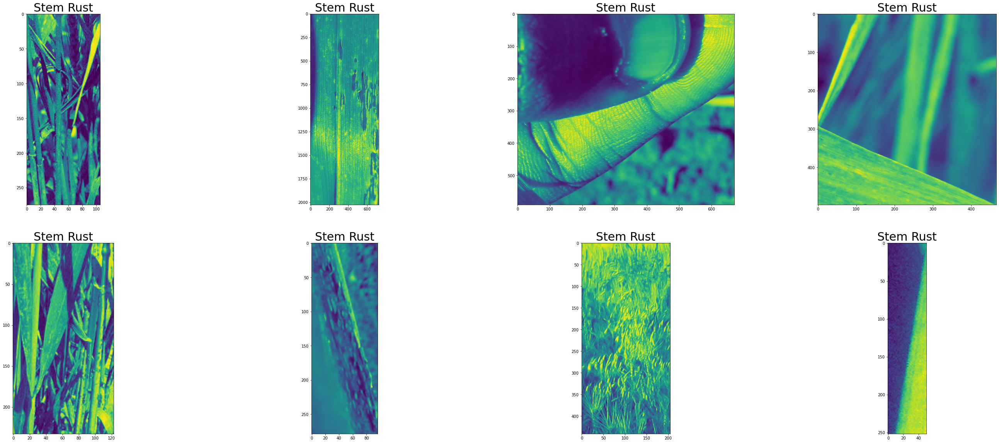

In [21]:
#Augmenting images to RGB to Gray and finging contour
count = 1
f = plt.figure(figsize=(50,20))
for file in stem_rust_images[:8]:
    img = cv2.imread(file)
    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    adapimg = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV,11,3)
    cnts = cv2.findContours(adapimg, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    cnts = sorted(cnts, key=cv2.contourArea, reverse=True)
    for c in cnts:
        x,y,w,h = cv2.boundingRect(c)
        img_ROI = img[y:y+h, x:x+w]
        break
    ax = f.add_subplot(2, 4,count)
    ax = plt.imshow(img_ROI)
    ax = plt.title('Stem Rust',fontsize= 30)
    count = count + 1
plt.show()

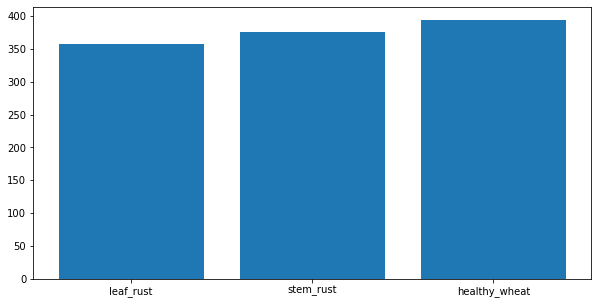

In [98]:
#Data Distribtion after balancing the data
folders = os.listdir(source_path)

train_number = []
class_num = []

for folder in folders:
    train_files = os.listdir(source_path + '/' + folder)
    train_number.append(len(train_files))
    class_num.append(folder)

zipped_lists = zip(train_number,class_num)
sorted_pairs = sorted(zipped_lists)
tuples = zip(*sorted_pairs)
train_number,class_num = [ list(tuple) for tuple in  tuples]

plt.figure(figsize=(10,5))  
plt.bar(class_num, train_number)
plt.xticks(class_num)
plt.show()

In [22]:
TRAIN_DIR = 'train/'
TEST_DIR = 'test/'

In [23]:
#Setting target size and batch size
gen = ImageDataGenerator(rescale=1./255)
train = gen.flow_from_directory(directory=TRAIN_DIR, target_size=(224,224), batch_size=32,shuffle=True)

Found 848 images belonging to 3 classes.


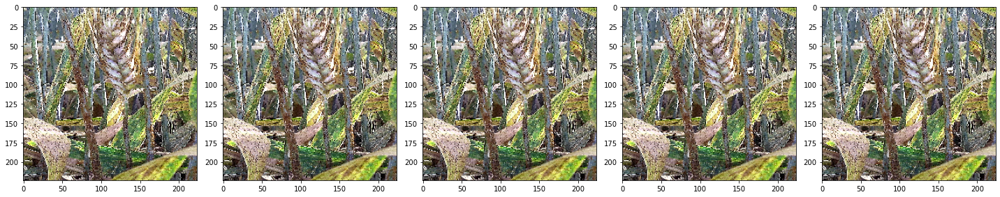

In [24]:
# This function will plot images in the form of a grid with 1 row and 5 columns where images are placed in each column.
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip(images_arr, axes):
        ax.imshow(img)
    plt.tight_layout()
    plt.show()

augmented_images = [train[0][0][0] for i in range(5)]
plotImages(augmented_images)

In [25]:
#Setting target size and batch size
gen = ImageDataGenerator(rescale=1./255)
test = gen.flow_from_directory(directory=TEST_DIR, target_size=(224,224), batch_size=32, shuffle=True)

Found 280 images belonging to 3 classes.


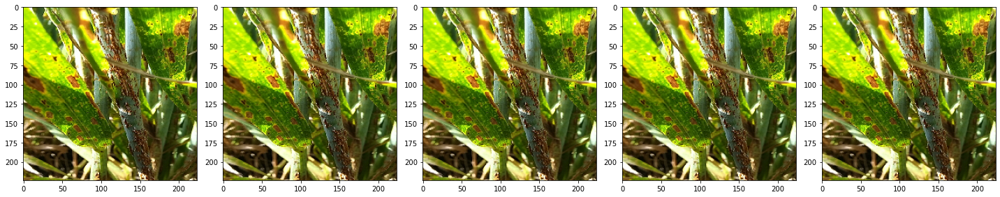

In [26]:
# This function will plot images in the form of a grid with 1 row and 5 columns where images are placed in each column.
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
    plt.tight_layout()
    plt.show()

augmented_images = [test[0][0][0] for i in range(5)]
plotImages(augmented_images)

In [14]:

file_path=r'C:/Users/Nik/Desktop/Plant Disease/train/'
num_classes = ['healthy_wheat','leaf_rust','stem_rust']
IMG_SIZE = 224

In [15]:
#creating labels for all the classes
from skimage import io,color,exposure,transform
def preprocess_img(img,label,IMG_SIZE=IMG_SIZE):
    
    img = transform.resize(img, (IMG_SIZE, IMG_SIZE))
    
    if label == 'healthy_wheat':
        label = 0
    elif label == 'leaf_rust':
        label = 1
    else:
        label = 2
    
    return img,label

In [16]:
def prepare_data(classes=num_classes,file_path=file_path):
    data1 = []
    labels1 = []
    for i in classes:
        path = os.path.join(file_path,str(i))
        images = os.listdir(path)
        for a in images:
            try:
                img = cv2.imread(path + '/' + a)
                img,j=preprocess_img(img=img,label=i)
                data1.append(img)
                labels1.append(j)
            except Exception as e:
                print(e)
    return np.array(data1),np.array(labels1)

In [17]:
X,y = prepare_data(num_classes,file_path)

In [18]:
print(f'X_val shape is: {X.shape}')
print('y_val shape is: {}'.format(y.shape))

X_val shape is: (848, 224, 224, 3)
y_val shape is: (848,)


In [ ]:
#Setting values for X_train, X_test, y_train,and y_test
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,shuffle=True,random_state=123)

In [23]:
#converting class vector to binary (one hot encoder) metrix
y_train=tf.keras.utils.to_categorical(y_train,3)
y_test=tf.keras.utils.to_categorical(y_test,3)

In [24]:
#checking size of dataset
print("shape of x_train: ",X_train.shape)
print("shape of y_train: {}".format(y_train.shape))
print(f'shape of x_test: {X_test.shape}')
print(f'shape of y_test: {y_test.shape}')

shape of x_train:  (678, 224, 224, 3)
shape of y_train: (678, 3)
shape of x_test: (170, 224, 224, 3)
shape of y_test: (170, 3)


# Model Building - VGG16

In [25]:
model = Sequential()

#VGG16 Block 1
model.add(Conv2D(input_shape=(224,224,3),filters=64,kernel_size=(3,3),padding="same", activation="relu"))
model.add(Conv2D(filters=64,kernel_size=(3,3),padding="same", activation="relu", trainable=False))
model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))

In [26]:
#VGG16 Block 2
model.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"))
model.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu", trainable=False))
model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))

In [27]:
#VGG16 Block 3
model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu", trainable=False))
model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu", trainable=False))
model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu", trainable=False))
model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))

In [28]:
#VGG16 Block 4
model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu", trainable=False))
model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu", trainable=False))
model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu", trainable=False))
model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))

In [29]:
#VGG16 Block 5
model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu", trainable=False))
model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu", trainable=False))
model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu", trainable=False))

In [30]:
#VGG16 Block 6
model.add(Flatten(name='flatten'))
model.add(Dense(512, activation='relu', trainable=False))
model.add(Dense(4096, activation='relu', trainable=False))
model.add(Dropout(0.5))
model.add(Dense(units=3, activation="Softmax"))

In [31]:
#Setting compilation metrics
import tensorflow as tf
opt = Adam(lr=0.01)
loss = tf.keras.losses.CategoricalCrossentropy()
model.compile(optimizer=opt, loss=loss, metrics=['accuracy'])

C:\Users\Nik\anaconda3\lib\site-packages\keras\optimizer_v2\adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [32]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 64)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 112, 112, 128)     73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 112, 112, 128)     147584    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 56, 56, 128)      0         
 2D)                                                    

In [33]:
history = model.fit(X_train,y_train, validation_data= (X_test,y_test), epochs=80)

Epoch 1/80
22/22 [==============================] - 223s 9s/step - loss: 1.0970 - accuracy: 0.3215 - val_loss: 1.0641 - val_accuracy: 0.3824
Epoch 2/80
22/22 [==============================] - 200s 9s/step - loss: 1.0761 - accuracy: 0.3673 - val_loss: 1.0490 - val_accuracy: 0.5471
Epoch 3/80
22/22 [==============================] - 201s 9s/step - loss: 1.0263 - accuracy: 0.4440 - val_loss: 1.0039 - val_accuracy: 0.5471
Epoch 4/80
22/22 [==============================] - 199s 9s/step - loss: 1.0022 - accuracy: 0.4882 - val_loss: 0.9145 - val_accuracy: 0.5000
Epoch 5/80
22/22 [==============================] - 204s 9s/step - loss: 0.9515 - accuracy: 0.5369 - val_loss: 0.8828 - val_accuracy: 0.6176
Epoch 6/80
22/22 [==============================] - 197s 9s/step - loss: 0.9012 - accuracy: 0.5708 - val_loss: 0.8654 - val_accuracy: 0.6176
Epoch 7/80
22/22 [==============================] - 201s 9s/step - loss: 0.8359 - accuracy: 0.6180 - val_loss: 0.8794 - val_accuracy: 0.5706
Epoch 8/80
22

Epoch 59/80
22/22 [==============================] - 211s 10s/step - loss: 0.3574 - accuracy: 0.8658 - val_loss: 0.9665 - val_accuracy: 0.6941
Epoch 60/80
22/22 [==============================] - 266s 12s/step - loss: 0.3539 - accuracy: 0.8717 - val_loss: 0.7431 - val_accuracy: 0.7353
Epoch 61/80
22/22 [==============================] - 272s 12s/step - loss: 0.3622 - accuracy: 0.8599 - val_loss: 0.7838 - val_accuracy: 0.7000
Epoch 62/80
22/22 [==============================] - 265s 12s/step - loss: 0.3721 - accuracy: 0.8761 - val_loss: 0.7058 - val_accuracy: 0.7235
Epoch 63/80
22/22 [==============================] - 256s 12s/step - loss: 0.2983 - accuracy: 0.8850 - val_loss: 0.7779 - val_accuracy: 0.7118
Epoch 64/80
22/22 [==============================] - 258s 12s/step - loss: 0.2920 - accuracy: 0.8805 - val_loss: 0.7569 - val_accuracy: 0.7412
Epoch 65/80
22/22 [==============================] - 255s 12s/step - loss: 0.3110 - accuracy: 0.8776 - val_loss: 0.9307 - val_accuracy: 0.7235

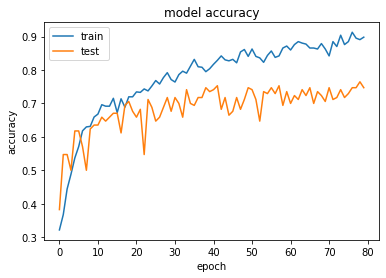

In [34]:
# summarize VGG16 model accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

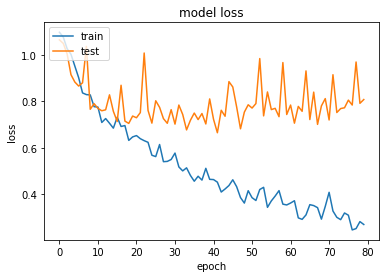

In [35]:
# summarize VGG16 model loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# Test Data Results

In [38]:
#Predicting values for classification report
y_pred = np.argmax(model.predict(X_test),axis=-1)
y_pred[:10]

array([1, 1, 0, 0, 2, 1, 0, 0, 0, 2], dtype=int64)

In [39]:
y_test1 = np.argmax(y_test, axis=-1)

In [42]:
#Getting Accuracy for test data
acc = np.sum(y_pred==y_test1)/np.size(y_test1)
print("Validation accuracy = {}".format(acc))

Validation accuracy = 0.7470588235294118


In [44]:
#Confusion matrix
cf_matrix=metrics.confusion_matrix(y_test1, y_pred)

In [48]:
#Classification Report
print(metrics.classification_report(y_test1, y_pred))

              precision    recall  f1-score   support

           0       0.82      0.91      0.86        65
           1       0.65      0.58      0.62        48
           2       0.73      0.70      0.71        57

    accuracy                           0.75       170
   macro avg       0.73      0.73      0.73       170
weighted avg       0.74      0.75      0.74       170



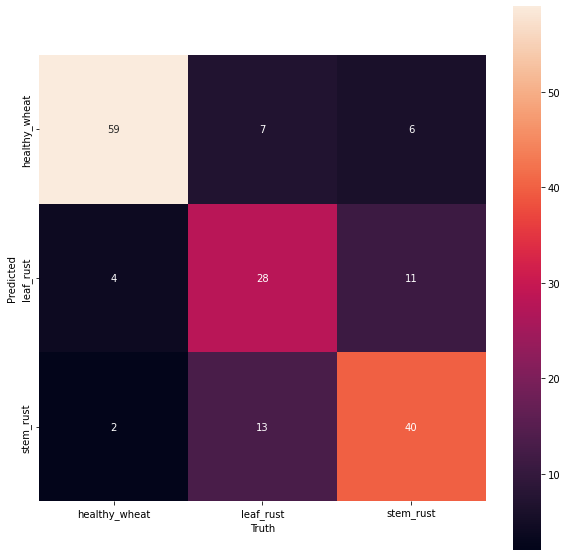

In [49]:
#Plotting Confusion matrix
target_names=['healthy_wheat','leaf_rust','stem_rust']

plt.figure(figsize=(10,10))
cm = confusion_matrix(y_test1, y_pred)
_=sns.heatmap(cm.T, annot=True, fmt='d', cbar=True, square=True, xticklabels=target_names,
             yticklabels=target_names)
plt.xlabel('Truth')
plt.ylabel('Predicted')
plt.savefig('./'+'confusion_matrix_onValidation.jpeg',dpi=93)

# Train Data Results

In [50]:
#Predicting values for classification report
y_pred = np.argmax(model.predict(X_train),axis=-1)
y_pred[:10]

array([2, 1, 2, 2, 1, 2, 2, 2, 2, 2], dtype=int64)

In [51]:
y_train1 = np.argmax(y_train, axis=-1)

In [53]:
#Getting Accuracy for train data
acc = np.sum(y_pred==y_train1)/np.size(y_train1)
print("Validation accuracy = {}".format(acc))

Validation accuracy = 0.9469026548672567


In [54]:
#Confusion matrix
cf_matrix=metrics.confusion_matrix(y_train1, y_pred)

In [56]:
#Classification Report
print(metrics.classification_report(y_train1, y_pred))

              precision    recall  f1-score   support

           0       0.92      1.00      0.96       231
           1       0.99      0.88      0.93       221
           2       0.94      0.96      0.95       226

    accuracy                           0.95       678
   macro avg       0.95      0.95      0.95       678
weighted avg       0.95      0.95      0.95       678



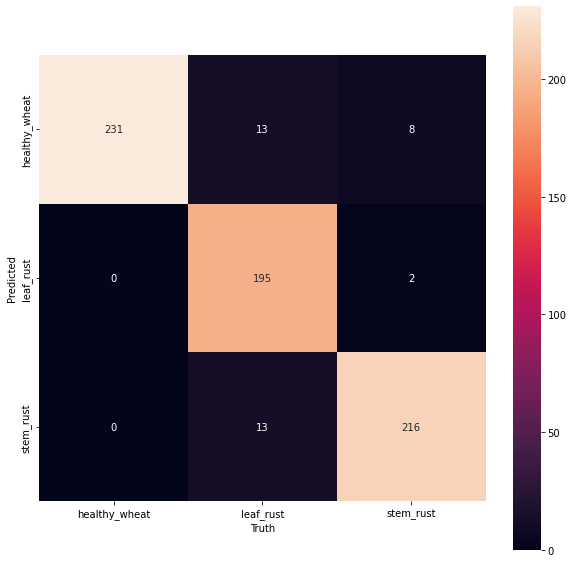

In [57]:
#Plotting Confusion matrix
target_names=['healthy_wheat','leaf_rust','stem_rust']

plt.figure(figsize=(10,10))
cm = confusion_matrix(y_train1, y_pred)
_=sns.heatmap(cm.T, annot=True, fmt='d', cbar=True, square=True, xticklabels=target_names,
             yticklabels=target_names)
plt.xlabel('Truth')
plt.ylabel('Predicted')
plt.savefig('./'+'confusion_matrix_onValidation.jpeg',dpi=93)

# CNN Model

In [27]:
#Building CNN model layers
input_shape = (224, 224, 3) 

model3 = Sequential()

model3.add(Conv2D(32, (3,3), input_shape=input_shape, activation='relu',data_format='channels_last'))
model3.add(MaxPooling2D((2,2), strides=(1,1), padding='same'),)

model3.add(Conv2D(64, (3,3), activation='relu'),)
model3.add(MaxPooling2D((2,2), strides=(1,1), padding='same'),)

model3.add(Conv2D(128, (3,3), activation='relu', trainable=False),)
model3.add(MaxPooling2D((2,2), strides=(1,1), padding='same'),)

model3.add(Flatten())

model3.add(Dense(128, activation='relu', trainable=False))
model3.add(Dense(64, activation='relu'))

model3.add(Dropout(0.5))
model3.add(Dense(3, activation='softmax'))

In [28]:
model3.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 222, 222, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 220, 220, 64)     0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 218, 218, 128)     73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 218, 218, 128)    0

In [29]:
#Setting Model compilation metrics
model3.compile(loss ='categorical_crossentropy',
                     optimizer ='rmsprop', 
                   metrics =['accuracy']) 

In [30]:
H = model3.fit(train, epochs = 80, validation_data = test) 

Epoch 1/80
27/27 [==============================] - 448s 16s/step - loss: 1.0859 - accuracy: 0.3726 - val_loss: 1.0629 - val_accuracy: 0.5107
Epoch 2/80
27/27 [==============================] - 403s 15s/step - loss: 1.0230 - accuracy: 0.5071 - val_loss: 0.9808 - val_accuracy: 0.5321
Epoch 3/80
27/27 [==============================] - 404s 15s/step - loss: 0.9464 - accuracy: 0.5307 - val_loss: 0.9119 - val_accuracy: 0.5464
Epoch 4/80
27/27 [==============================] - 408s 15s/step - loss: 0.8988 - accuracy: 0.5507 - val_loss: 0.9574 - val_accuracy: 0.5107
Epoch 5/80
27/27 [==============================] - 405s 15s/step - loss: 0.8552 - accuracy: 0.5873 - val_loss: 0.8517 - val_accuracy: 0.5607
Epoch 6/80
27/27 [==============================] - 403s 15s/step - loss: 0.8318 - accuracy: 0.5837 - val_loss: 0.8986 - val_accuracy: 0.5250
Epoch 7/80
27/27 [==============================] - 388s 14s/step - loss: 0.8082 - accuracy: 0.6215 - val_loss: 0.8233 - val_accuracy: 0.5893
Epoch 

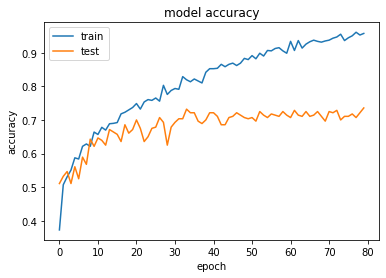

In [31]:
# summarize CNN model accuracy
plt.plot(H.history['accuracy'])
plt.plot(H.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

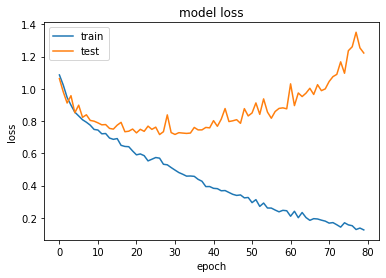

In [32]:
# summarize CNN model loss
plt.plot(H.history['loss'])
plt.plot(H.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [34]:
#Accuracy and loss for Test data
score = model3.evaluate(test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 1.2219582796096802
Test accuracy: 0.7357142567634583


In [35]:
#Accuracy and loss for Train data
score = model3.evaluate(train, verbose=0)
print('Train loss:', score[0])
print('Train accuracy:', score[1])

Train loss: 0.07791338860988617
Train accuracy: 0.9823113083839417


# AlexNet Model

In [36]:
#Building AlexNet model layers
model5 = keras.models.Sequential([
    keras.layers.Conv2D(filters=96, kernel_size=(11,11), strides=(4,4), activation='relu', input_shape=(224,224,3)),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Conv2D(filters=256, kernel_size=(5,5), strides=(1,1), activation='relu', padding="same", trainable=False),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same", trainable=False),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same", trainable=False),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=256, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same", trainable=False),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Flatten(),
    keras.layers.Dense(4096, activation='relu', trainable=False),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(4096, activation='relu', trainable=False),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(3, activation='softmax')
])

In [37]:
#Setting model compilation metrics
opt = tensorflow.keras.optimizers.Adam(learning_rate=0.001)
model5.compile(optimizer=opt,loss="categorical_crossentropy",metrics=['accuracy'])
model5.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 54, 54, 96)        34944     
                                                                 
 batch_normalization (BatchN  (None, 54, 54, 96)       384       
 ormalization)                                                   
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 26, 26, 96)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 26, 26, 256)       614656    
                                                                 
 batch_normalization_1 (Batc  (None, 26, 26, 256)      1024      
 hNormalization)                                                 
                                                      

In [38]:
H4 = model5.fit(train, epochs = 80, validation_data = test)

Epoch 1/80
27/27 [==============================] - 123s 5s/step - loss: 2.3886 - accuracy: 0.3538 - val_loss: 1.1010 - val_accuracy: 0.3071
Epoch 2/80
27/27 [==============================] - 122s 5s/step - loss: 1.9014 - accuracy: 0.4882 - val_loss: 1.0940 - val_accuracy: 0.3536
Epoch 3/80
27/27 [==============================] - 120s 4s/step - loss: 1.4995 - accuracy: 0.5519 - val_loss: 1.0854 - val_accuracy: 0.3679
Epoch 4/80
27/27 [==============================] - 120s 5s/step - loss: 1.4711 - accuracy: 0.5519 - val_loss: 1.0569 - val_accuracy: 0.4857
Epoch 5/80
27/27 [==============================] - 120s 4s/step - loss: 1.3967 - accuracy: 0.5802 - val_loss: 1.0632 - val_accuracy: 0.3714
Epoch 6/80
27/27 [==============================] - 120s 5s/step - loss: 1.2278 - accuracy: 0.6156 - val_loss: 1.0089 - val_accuracy: 0.5393
Epoch 7/80
27/27 [==============================] - 120s 4s/step - loss: 1.3089 - accuracy: 0.5908 - val_loss: 0.9479 - val_accuracy: 0.5607
Epoch 8/80
27

Epoch 59/80
27/27 [==============================] - 120s 4s/step - loss: 0.5854 - accuracy: 0.7925 - val_loss: 0.7065 - val_accuracy: 0.7607
Epoch 60/80
27/27 [==============================] - 120s 4s/step - loss: 0.5327 - accuracy: 0.8278 - val_loss: 1.2899 - val_accuracy: 0.5893
Epoch 61/80
27/27 [==============================] - 120s 4s/step - loss: 0.4924 - accuracy: 0.8337 - val_loss: 0.7303 - val_accuracy: 0.7071
Epoch 62/80
27/27 [==============================] - 120s 4s/step - loss: 0.5442 - accuracy: 0.8184 - val_loss: 0.7331 - val_accuracy: 0.7357
Epoch 63/80
27/27 [==============================] - 120s 5s/step - loss: 0.4768 - accuracy: 0.8278 - val_loss: 0.6957 - val_accuracy: 0.7536
Epoch 64/80
27/27 [==============================] - 120s 4s/step - loss: 0.5320 - accuracy: 0.8219 - val_loss: 0.7746 - val_accuracy: 0.7071
Epoch 65/80
27/27 [==============================] - 121s 4s/step - loss: 0.4597 - accuracy: 0.8349 - val_loss: 1.2445 - val_accuracy: 0.6536
Epoch 

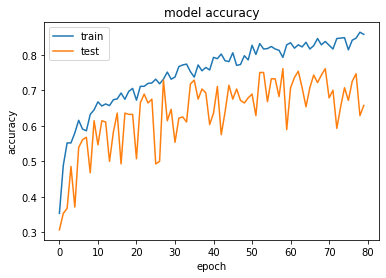

In [39]:
# summarize AlexNet model accuracy
plt.plot(H4.history['accuracy'])
plt.plot(H4.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

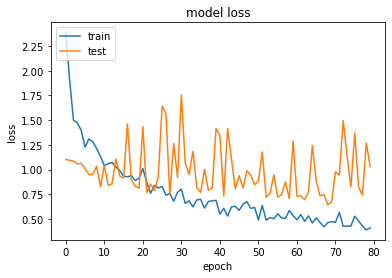

In [40]:
# summarize AlexNet model loss
plt.plot(H4.history['loss'])
plt.plot(H4.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [41]:
#Accuracy and loss for Train data
score = model5.evaluate(train, verbose=0)
print('Train loss:', score[0])
print('Train accuracy:', score[1])

Train loss: 0.42562422156333923
Train accuracy: 0.8066037893295288


In [42]:
#Accuracy and loss for Test data
score = model5.evaluate(test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 1.0300687551498413
Test accuracy: 0.6571428775787354


# GoogleNet Model

In [44]:
#GoogleNet model inception block
def Inception_block(input_layer, f1, f2_conv1, f2_conv3, f3_conv1, f3_conv5, f4): 
  # Input: 
  # - f1: number of filters of the 1x1 convolutional layer in the first path
  # - f2_conv1, f2_conv3 are number of filters corresponding to the 1x1 and 3x3 convolutional layers in the second path
  # - f3_conv1, f3_conv5 are the number of filters corresponding to the 1x1 and 5x5  convolutional layer in the third path
  # - f4: number of filters of the 1x1 convolutional layer in the fourth path

  # 1st path:
  path1 = Conv2D(filters=f1, kernel_size = (1,1), padding = 'same', activation = 'relu')(input_layer)

  # 2nd path
  path2 = Conv2D(filters = f2_conv1, kernel_size = (1,1), padding = 'same', activation = 'relu')(input_layer)
  path2 = Conv2D(filters = f2_conv3, kernel_size = (3,3), padding = 'same', activation = 'relu')(path2)

  # 3rd path
  path3 = Conv2D(filters = f3_conv1, kernel_size = (1,1), padding = 'same', activation = 'relu')(input_layer)
  path3 = Conv2D(filters = f3_conv5, kernel_size = (5,5), padding = 'same', activation = 'relu')(path3)

  # 4th path
  path4 = MaxPooling2D((3,3), strides= (1,1), padding = 'same')(input_layer)
  path4 = Conv2D(filters = f4, kernel_size = (1,1), padding = 'same', activation = 'relu')(path4)

  output_layer = concatenate([path1, path2, path3, path4], axis = -1)

  return output_layer

In [45]:
def GoogLeNet():
  #input layer 
  input_layer = Input(shape = (224, 224, 3))

  X = Conv2D(filters = 64, kernel_size = (7,7), strides = 2, padding = 'valid', activation = 'relu')(input_layer)

  X = MaxPooling2D(pool_size = (3,3), strides = 2)(X)

  X = Conv2D(filters = 64, kernel_size = (1,1), strides = 1, padding = 'same', activation = 'relu', trainable=False)(X)

  X = Conv2D(filters = 192, kernel_size = (3,3), padding = 'same', activation = 'relu', trainable=False)(X)

  X = MaxPooling2D(pool_size= (3,3), strides = 2)(X)

  #Inception block 1st
  X = Inception_block(X, f1 = 64, f2_conv1 = 96, f2_conv3 = 128, f3_conv1 = 16, f3_conv5 = 32, f4 = 32)

  #Inception block 2nd
  X = Inception_block(X, f1 = 128, f2_conv1 = 128, f2_conv3 = 192, f3_conv1 = 32, f3_conv5 = 96, f4 = 64)

  X = MaxPooling2D(pool_size= (3,3), strides = 2)(X)

  #Inception block 3rd
  X = Inception_block(X, f1 = 192, f2_conv1 = 96, f2_conv3 = 208, f3_conv1 = 16, f3_conv5 = 48, f4 = 64)

  X1 = AveragePooling2D(pool_size = (5,5), strides = 3)(X)
  X1 = Conv2D(filters = 128, kernel_size = (1,1), padding = 'same', activation = 'relu', trainable=False)(X1)
  X1 = Flatten()(X1)
  X1 = Dense(1024, activation = 'relu', trainable=False)(X1)
  X1 = Dropout(0.7)(X1)
  X1 = Dense(3, activation = 'softmax')(X1)

  
  #Inception block 4th
  X = Inception_block(X, f1 = 160, f2_conv1 = 112, f2_conv3 = 224, f3_conv1 = 24, f3_conv5 = 64, f4 = 64)

  #Inception block 5th
  X = Inception_block(X, f1 = 128, f2_conv1 = 128, f2_conv3 = 256, f3_conv1 = 24, f3_conv5 = 64, f4 = 64)

  #Inception block 6th
  X = Inception_block(X, f1 = 112, f2_conv1 = 144, f2_conv3 = 288, f3_conv1 = 32, f3_conv5 = 64, f4 = 64)

  X2 = AveragePooling2D(pool_size = (5,5), strides = 3)(X)
  X2 = Conv2D(filters = 128, kernel_size = (1,1), padding = 'same', activation = 'relu', trainable=False)(X2)
  X2 = Flatten()(X2)
  X2 = Dense(1024, activation = 'relu', trainable=False)(X2)
  X2 = Dropout(0.7)(X2)
  X2 = Dense(3, activation = 'softmax')(X2)
  
  
  #Inception block 7th
  X = Inception_block(X, f1 = 256, f2_conv1 = 160, f2_conv3 = 320, f3_conv1 = 32, 
                      f3_conv5 = 128, f4 = 128)

  X = MaxPooling2D(pool_size = (3,3), strides = 2)(X)

  #Inception block 8th
  X = Inception_block(X, f1 = 256, f2_conv1 = 160, f2_conv3 = 320, f3_conv1 = 32, f3_conv5 = 128, f4 = 128)

  #Inception block 9th
  X = Inception_block(X, f1 = 384, f2_conv1 = 192, f2_conv3 = 384, f3_conv1 = 48, f3_conv5 = 128, f4 = 128)

  #Global Average layer 
  X = GlobalAveragePooling2D(name = 'GAPL')(X)

  #Dropout layer 
  X = Dropout(0.4)(X)

  #output layer 
  X = Dense(3, activation = 'softmax')(X)
  
  model7 = Model(input_layer, [X, X1, X2], name = 'GoogLeNet')

  return model7

In [46]:
model7 = GoogLeNet()
model7.summary()

Model: "GoogLeNet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_8 (Conv2D)              (None, 109, 109, 64  9472        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 max_pooling2d_6 (MaxPooling2D)  (None, 54, 54, 64)  0           ['conv2d_8[0][0]']               
                                                                                          

 )                                                                                                
                                                                                                  
 conv2d_30 (Conv2D)             (None, 12, 12, 160)  82080       ['concatenate_2[0][0]']          
                                                                                                  
 conv2d_32 (Conv2D)             (None, 12, 12, 224)  226016      ['conv2d_31[0][0]']              
                                                                                                  
 conv2d_34 (Conv2D)             (None, 12, 12, 64)   38464       ['conv2d_33[0][0]']              
                                                                                                  
 conv2d_35 (Conv2D)             (None, 12, 12, 64)   32832       ['max_pooling2d_12[0][0]']       
                                                                                                  
 concatena

 )                                                                                                
                                                                                                  
 conv2d_55 (Conv2D)             (None, 5, 5, 256)    213248      ['max_pooling2d_16[0][0]']       
                                                                                                  
 conv2d_57 (Conv2D)             (None, 5, 5, 320)    461120      ['conv2d_56[0][0]']              
                                                                                                  
 conv2d_59 (Conv2D)             (None, 5, 5, 128)    102528      ['conv2d_58[0][0]']              
                                                                                                  
 conv2d_60 (Conv2D)             (None, 5, 5, 128)    106624      ['max_pooling2d_17[0][0]']       
                                                                                                  
 concatena

In [47]:
opt = tensorflow.keras.optimizers.Adam(learning_rate=0.001)
model7.compile(optimizer=opt,loss="categorical_crossentropy",metrics=['accuracy'])

In [48]:
H6 = model7.fit(train, epochs = 80, validation_data = test)

Epoch 1/80
27/27 [==============================] - 146s 5s/step - loss: 3.3107 - dense_10_loss: 1.1112 - dense_7_loss: 1.0979 - dense_9_loss: 1.1016 - dense_10_accuracy: 0.3561 - dense_7_accuracy: 0.3455 - dense_9_accuracy: 0.3502 - val_loss: 3.2899 - val_dense_10_loss: 1.0976 - val_dense_7_loss: 1.0949 - val_dense_9_loss: 1.0974 - val_dense_10_accuracy: 0.3500 - val_dense_7_accuracy: 0.3500 - val_dense_9_accuracy: 0.3500
Epoch 2/80
27/27 [==============================] - 140s 5s/step - loss: 3.2492 - dense_10_loss: 1.0897 - dense_7_loss: 1.0757 - dense_9_loss: 1.0839 - dense_10_accuracy: 0.3573 - dense_7_accuracy: 0.4198 - dense_9_accuracy: 0.3821 - val_loss: 3.0498 - val_dense_10_loss: 1.0164 - val_dense_7_loss: 1.0042 - val_dense_9_loss: 1.0292 - val_dense_10_accuracy: 0.4857 - val_dense_7_accuracy: 0.5143 - val_dense_9_accuracy: 0.3500
Epoch 3/80
27/27 [==============================] - 138s 5s/step - loss: 3.2958 - dense_10_loss: 1.1008 - dense_7_loss: 1.0886 - dense_9_loss: 1.1

27/27 [==============================] - 134s 5s/step - loss: 1.5071 - dense_10_loss: 0.4342 - dense_7_loss: 0.5624 - dense_9_loss: 0.5106 - dense_10_accuracy: 0.8125 - dense_7_accuracy: 0.7441 - dense_9_accuracy: 0.7712 - val_loss: 2.0850 - val_dense_10_loss: 0.7693 - val_dense_7_loss: 0.6506 - val_dense_9_loss: 0.6651 - val_dense_10_accuracy: 0.6786 - val_dense_7_accuracy: 0.7179 - val_dense_9_accuracy: 0.7321
Epoch 40/80
27/27 [==============================] - 134s 5s/step - loss: 1.5235 - dense_10_loss: 0.4284 - dense_7_loss: 0.5793 - dense_9_loss: 0.5159 - dense_10_accuracy: 0.8137 - dense_7_accuracy: 0.7370 - dense_9_accuracy: 0.7606 - val_loss: 2.5027 - val_dense_10_loss: 1.0157 - val_dense_7_loss: 0.7765 - val_dense_9_loss: 0.7105 - val_dense_10_accuracy: 0.6607 - val_dense_7_accuracy: 0.6750 - val_dense_9_accuracy: 0.7071
Epoch 41/80
27/27 [==============================] - 134s 5s/step - loss: 1.5376 - dense_10_loss: 0.4372 - dense_7_loss: 0.5853 - dense_9_loss: 0.5150 - den

27/27 [==============================] - 140s 5s/step - loss: 0.6933 - dense_10_loss: 0.0842 - dense_7_loss: 0.4168 - dense_9_loss: 0.1924 - dense_10_accuracy: 0.9682 - dense_7_accuracy: 0.8090 - dense_9_accuracy: 0.9198 - val_loss: 3.0699 - val_dense_10_loss: 1.5783 - val_dense_7_loss: 0.5771 - val_dense_9_loss: 0.9145 - val_dense_10_accuracy: 0.7357 - val_dense_7_accuracy: 0.7786 - val_dense_9_accuracy: 0.7607
Epoch 78/80
27/27 [==============================] - 142s 5s/step - loss: 0.6680 - dense_10_loss: 0.0868 - dense_7_loss: 0.4034 - dense_9_loss: 0.1778 - dense_10_accuracy: 0.9682 - dense_7_accuracy: 0.8314 - dense_9_accuracy: 0.9351 - val_loss: 3.2860 - val_dense_10_loss: 1.7707 - val_dense_7_loss: 0.5978 - val_dense_9_loss: 0.9175 - val_dense_10_accuracy: 0.7357 - val_dense_7_accuracy: 0.7714 - val_dense_9_accuracy: 0.7429
Epoch 79/80
27/27 [==============================] - 140s 5s/step - loss: 0.5978 - dense_10_loss: 0.0527 - dense_7_loss: 0.3911 - dense_9_loss: 0.1540 - den

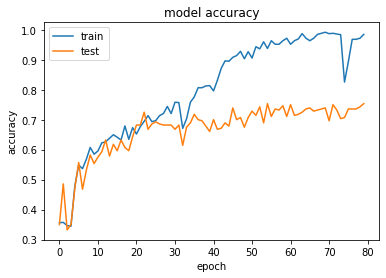

In [62]:
# summarize GoogleNet model accuracy
plt.plot(H6.history['dense_10_accuracy'])
plt.plot(H6.history['val_dense_10_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

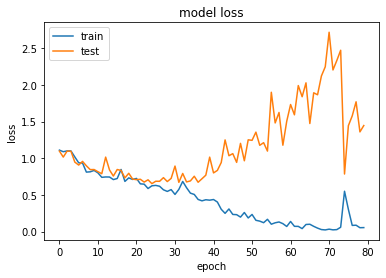

In [63]:
# summarize GoogleNet model loss
plt.plot(H6.history['dense_10_loss'])
plt.plot(H6.history['val_dense_10_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()